In [14]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt

Number of images of Tomato___Late_blight: 1851 || Number of images of Tomato___healthy: 1926 || Number of images of Grape___healthy: 1692 || Number of images of Orange___Haunglongbing_(Citrus_greening): 2010 || Number of images of Soybean___healthy: 2022 || Number of images of Squash___Powdery_mildew: 1736 || Number of images of Potato___healthy: 1824 || Number of images of Corn_(maize)___Northern_Leaf_Blight: 1908 || Number of images of Tomato___Early_blight: 1920 || Number of images of Tomato___Septoria_leaf_spot: 1745 || Number of images of Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1642 || Number of images of Strawberry___Leaf_scorch: 1774 || Number of images of Peach___healthy: 1728 || Number of images of Apple___Apple_scab: 2016 || Number of images of Tomato___Tomato_Yellow_Leaf_Curl_Virus: 1961 || Number of images of Tomato___Bacterial_spot: 1702 || Number of images of Apple___Black_rot: 1987 || Number of images of Blueberry___healthy: 1816 || Number of images of Cherry

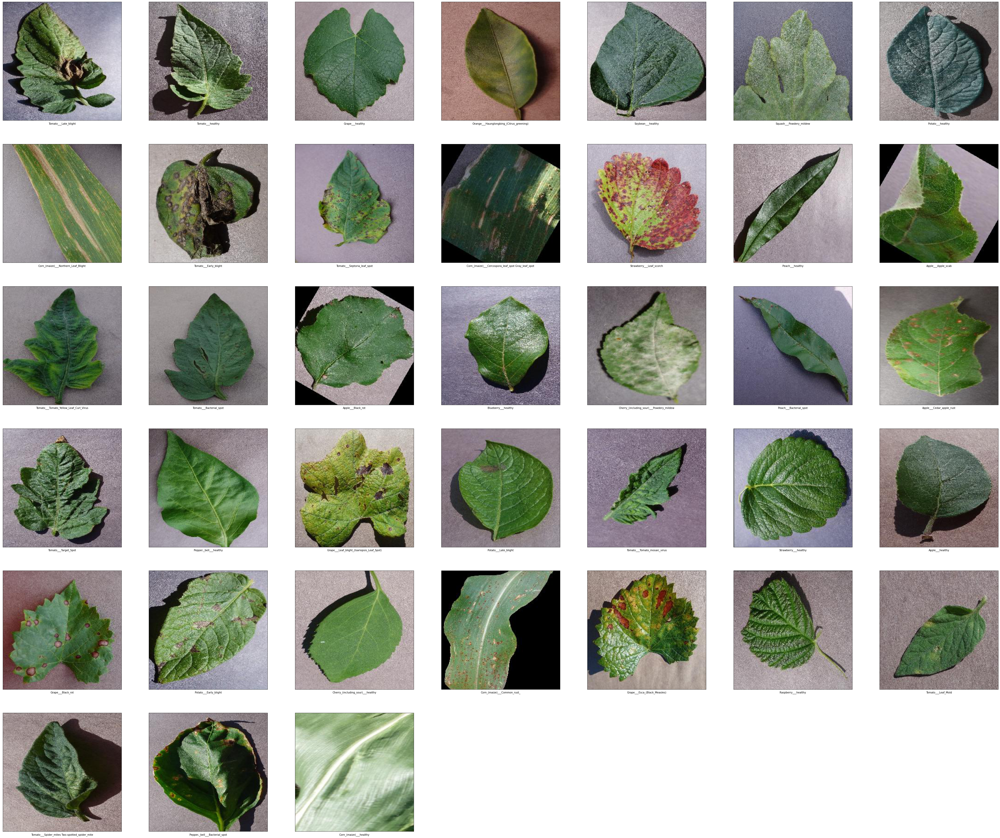

In [15]:
path='/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
plt.figure(figsize=(70,70))
count=0
plant_names=[]
total_images=0
for i in os.listdir(path):
  count+=1
  plant_names.append(i)
  plt.subplot(7,7,count)

  images_path=os.listdir(path+"/"+i)
  print("Number of images of "+i+":",len(images_path),"||",end=" ")
  total_images+=len(images_path)

  image_show=plt.imread(path+"/"+i+"/"+images_path[0])
  
  plt.imshow(image_show)
  plt.xlabel(i)
  
  plt.xticks([])
  plt.yticks([])


print("Total number of images we have",total_images)

In [16]:
print(plant_names)
print(len(plant_names))

['Tomato___Late_blight', 'Tomato___healthy', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Potato___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Tomato___Early_blight', 'Tomato___Septoria_leaf_spot', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Strawberry___Leaf_scorch', 'Peach___healthy', 'Apple___Apple_scab', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Bacterial_spot', 'Apple___Black_rot', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Peach___Bacterial_spot', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Pepper,_bell___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Potato___Late_blight', 'Tomato___Tomato_mosaic_virus', 'Strawberry___healthy', 'Apple___healthy', 'Grape___Black_rot', 'Potato___Early_blight', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Common_rust_', 'Grape___Esca_(Black_Measles)', 'Raspberry___healthy', 'Tomato___Leaf_Mold', 'Tomato__

In [17]:
import tensorflow
from tensorflow import keras
from keras.models import Sequential,load_model,Model
from keras.layers import Conv2D,MaxPool2D,AveragePooling2D,Dense,Flatten,ZeroPadding2D,BatchNormalization,Activation,Add,Input,Dropout,GlobalAveragePooling2D
from tensorflow.keras.optimizers import SGD
from keras.initializers import glorot_uniform
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint,EarlyStopping,ReduceLROnPlateau

In [18]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input

In [19]:
base_model_tf=ResNet50(include_top=False,weights='imagenet',input_shape=(224,224,3),classes=38)

In [20]:
base_model_tf.trainable=False

pt=Input(shape=(224,224,3))
func=tensorflow.cast(pt,tensorflow.float32)
x=preprocess_input(func) #This function used to zero-center each color channel wrt Imagenet dataset
model_resnet=base_model_tf(x,training=False)
model_resnet=GlobalAveragePooling2D()(model_resnet)
model_resnet=Dense(128,activation='relu')(model_resnet)
model_resnet=Dense(64,activation='relu')(model_resnet)
model_resnet=Dense(38,activation='softmax')(model_resnet)


model_main=Model(inputs=pt,outputs=model_resnet)
model_main.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
tf.cast_1 (TFOpLambda)       (None, 224, 224, 3)       0         
_________________________________________________________________
tf.__operators__.getitem_1 ( (None, 224, 224, 3)       0         
_________________________________________________________________
tf.nn.bias_add_1 (TFOpLambda (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, 7, 7, 2048)        23587712  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 128)               2622

In [21]:
path_train='/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'

In [22]:
train_datagen= ImageDataGenerator(shear_range=0.2,zoom_range=0.2,horizontal_flip=False,vertical_flip=False
                                  ,fill_mode='nearest',width_shift_range=0.2,height_shift_range=0.2,validation_split=0.05)

batch_size=32
train= train_datagen.flow_from_directory(directory=path_train,batch_size=32,target_size=(224,224),
                                         color_mode='rgb',class_mode='categorical',seed=42,subset='training')

test= train_datagen.flow_from_directory(
    path,
    target_size=(224,224),
    subset='validation') 

Found 66795 images belonging to 38 classes.
Found 3500 images belonging to 38 classes.


In [23]:
val_datagen=ImageDataGenerator()
path_valid='/kaggle/input/new-plant-diseases-dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'


valid=val_datagen.flow_from_directory(directory=path_valid,batch_size=32,target_size=(224,224),color_mode='rgb',class_mode='categorical')

Found 17572 images belonging to 38 classes.


In [24]:
es=EarlyStopping(monitor='val_accuracy',verbose=1,patience=7,mode='auto')
mc=ModelCheckpoint(filepath='/content',monitor='val_accuracy',verbose=1,save_best_only=True)
lr=ReduceLROnPlateau(monitor='val_accuracy',verbose=1,patience=5,min_lr=0.001)

In [25]:
model_main.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [26]:
model_main.fit(train,validation_data=valid,epochs=12,steps_per_epoch=400,verbose=1,callbacks=[mc,es,lr])

Epoch 1/12
400/400 [==============================] - 250s 619ms/step - loss: 0.9254 - accuracy: 0.7456 - val_loss: 0.3381 - val_accuracy: 0.8949

Epoch 00001: val_accuracy improved from -inf to 0.89495, saving model to /content


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 2/12
400/400 [==============================] - 235s 588ms/step - loss: 0.2954 - accuracy: 0.9059 - val_loss: 0.2332 - val_accuracy: 0.9219

Epoch 00002: val_accuracy improved from 0.89495 to 0.92192, saving model to /content


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 3/12
400/400 [==============================] - 229s 572ms/step - loss: 0.2113 - accuracy: 0.9315 - val_loss: 0.2103 - val_accuracy: 0.9284

Epoch 00003: val_accuracy improved from 0.92192 to 0.92835, saving model to /content


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 4/12
400/400 [==============================] - 226s 565ms/step - loss: 0.1878 - accuracy: 0.9379 - val_loss: 0.1501 - val_accuracy: 0.9523

Epoch 00004: val_accuracy improved from 0.92835 to 0.95225, saving model to /content


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 5/12
400/400 [==============================] - 229s 573ms/step - loss: 0.1717 - accuracy: 0.9422 - val_loss: 0.1782 - val_accuracy: 0.9392

Epoch 00005: val_accuracy did not improve from 0.95225
Epoch 6/12
400/400 [==============================] - 225s 562ms/step - loss: 0.1618 - accuracy: 0.9478 - val_loss: 0.1589 - val_accuracy: 0.9453

Epoch 00006: val_accuracy did not improve from 0.95225
Epoch 7/12
400/400 [==============================] - 221s 552ms/step - loss: 0.1522 - accuracy: 0.9484 - val_loss: 0.1408 - val_accuracy: 0.9537

Epoch 00007: val_accuracy improved from 0.95225 to 0.95368, saving model to /content


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 8/12
400/400 [==============================] - 223s 557ms/step - loss: 0.1362 - accuracy: 0.9550 - val_loss: 0.1814 - val_accuracy: 0.9417

Epoch 00008: val_accuracy did not improve from 0.95368
Epoch 9/12
400/400 [==============================] - 219s 546ms/step - loss: 0.1486 - accuracy: 0.9491 - val_loss: 0.1276 - val_accuracy: 0.9565

Epoch 00009: val_accuracy improved from 0.95368 to 0.95646, saving model to /content


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 10/12
400/400 [==============================] - 218s 546ms/step - loss: 0.1270 - accuracy: 0.9596 - val_loss: 0.1128 - val_accuracy: 0.9639

Epoch 00010: val_accuracy improved from 0.95646 to 0.96392, saving model to /content


/opt/conda/lib/python3.7/site-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 11/12
400/400 [==============================] - 250s 623ms/step - loss: 0.1213 - accuracy: 0.9596 - val_loss: 0.1233 - val_accuracy: 0.9586

Epoch 00011: val_accuracy did not improve from 0.96392
Epoch 12/12
400/400 [==============================] - 217s 543ms/step - loss: 0.1133 - accuracy: 0.9606 - val_loss: 0.1343 - val_accuracy: 0.9559

Epoch 00012: val_accuracy did not improve from 0.96392


In [27]:
model_main.save("cropDoctor2.h5")

In [28]:
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from PIL import Image

Text(0.5, 1.0, 'loss')

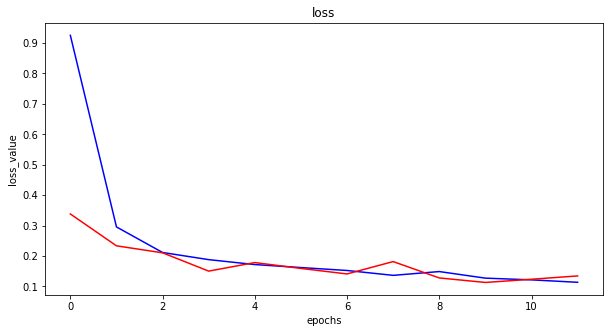

In [29]:
plt.figure(figsize=(10,5))
plt.plot(model_main.history.history['loss'],color='b',label='Training loss')
plt.plot(model_main.history.history['val_loss'],color='r',label='Validation loss')
plt.xlabel("epochs")
plt.ylabel("loss_value")
plt.title("loss")

Text(0.5, 1.0, 'accuracy graph')

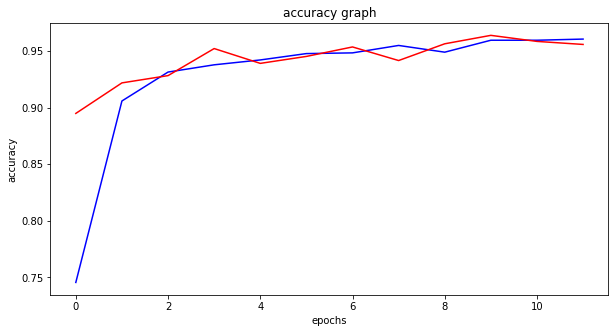

In [30]:
plt.figure(figsize=(10,5))
plt.plot(model_main.history.history['accuracy'],color='b',label='Training accuracy')
plt.plot(model_main.history.history['val_accuracy'],color='r',label='Validation accsuracy')
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.title("accuracy graph")

In [31]:
model_main.evaluate(valid)

550/550 [==============================] - 53s 97ms/step - loss: 0.1343 - accuracy: 0.9559


[0.13426853716373444, 0.955895721912384]

In [32]:
model_main.evaluate(test)

110/110 [==============================] - 55s 500ms/step - loss: 0.1370 - accuracy: 0.9566


[0.1369505673646927, 0.9565714001655579]

In [33]:
q=plant_names.sort()

In [34]:
print(plant_names)
classes=plant_names

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Sp

In [35]:
# classes=list(train.class_indices.keys())
# print(classes)
# print(plant_names)
# model=tf.keras.models.load_model('v4.h5')
import numpy as np
import matplotlib.pyplot as plt
# Pre-Processing test data same as train data.
img_width=224
img_height=224
model_main.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
from keras.preprocessing import image
def prepare(img_path):
    img = tensorflow.keras.utils.load_img(img_path, target_size=(224,224))
    x = tensorflow.keras.utils.img_to_array(img)
    return np.expand_dims(x, axis=0)
    
    
result = model_main.predict([prepare('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___Black_rot/00e909aa-e3ae-4558-9961-336bb0f35db3___JR_FrgE.S 8593.JPG')])

disease=tensorflow.keras.utils.load_img('/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___Black_rot/00e909aa-e3ae-4558-9961-336bb0f35db3___JR_FrgE.S 8593.JPG')
# print(classes[n])
plt.imshow(disease)
print(result)
import numpy as np
classresult=np.argmax(result,axis=1)
print(classes[classresult[0]])

FileNotFoundError: [Errno 2] No such file or directory: '/content/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Apple___Black_rot/00e909aa-e3ae-4558-9961-336bb0f35db3___JR_FrgE.S 8593.JPG'